In [1]:
import os
import random
import numpy as np
import pandas as pd 
from skimage import io
from skimage import color
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt
import seaborn as sns
from dask.array.image import imread
from dask import bag, threaded
from dask.diagnostics import ProgressBar
import cv2
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.utils import to_categorical
from keras.preprocessing import image 
from tensorflow.keras.layers import BatchNormalization
from keras import optimizers

In [2]:
## Check if system is using GPU
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 2986740175009973355
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
locality {
  bus_id: 1
}
incarnation: 12656222776053181858
physical_device_desc: "device: 0, name: METAL, pci bus id: <undefined>"
xla_global_id: -1
]Metal device set to: Apple M1 Pro

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB




2022-12-11 15:24:43.927321: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-12-11 15:24:43.927431: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


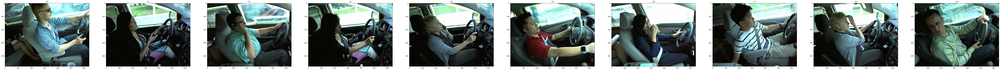

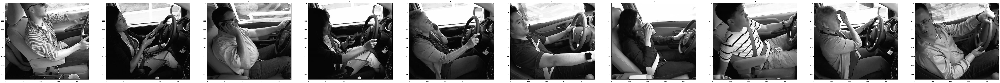

In [3]:
# getting one image per label
f, ax = plt.subplots(1,10, figsize = (120,120))
for i in range(10):
  #print('now we are in the folder C',i)
    labels = imread("../imgs/train/c"+str(i)+"/*.jpg")
    for j in range(1):
        img = labels[j]
        label = i
        ax[i].imshow(img)
        ax[i].set_title('C'+str(i))
        plt.show

# After Editing
f, ax = plt.subplots(1,10, figsize = (120,120))
for i in range(10):
  #print('now we are in the folder C',i)
    labels = imread("../imgs/train/c"+str(i)+"/*.jpg")
    for j in range(1):
        img = labels[j]
        img = color.rgb2gray(img)
        img = img[50:,120:-50]
        label = i
        ax[i].imshow(img,cmap='gray')
        ax[i].set_title('C'+str(i))
        plt.show


### Taring the dataset

In [4]:
train_image = []
image_label = []

for i in range(10):
    print('currently we are at the folder Class C',i)
    labels = imread("../imgs/train/c"+str(i)+"/*.jpg")
    for j in range(len(labels)):
  #for j in range(500):
        img = labels[j]
        img = color.rgb2gray(img)
        img = img[50:,120:-50]
        img = cv2.resize(img,(224,224))
        label = i
        train_image.append([img,label])
        image_label.append(i)

currently we are at the folder Class C 0
currently we are at the folder Class C 1
currently we are at the folder Class C 2
currently we are at the folder Class C 3
currently we are at the folder Class C 4
currently we are at the folder Class C 5
currently we are at the folder Class C 6
currently we are at the folder Class C 7
currently we are at the folder Class C 8
currently we are at the folder Class C 9


In [5]:
## Randomly shuffling the images
import random
random.shuffle(train_image)

In [6]:
## Splitting the image and label to two different lists
X, Y = [], []
for features,labels in train_image:
    X.append(features)
    Y.append(labels)
print (len(X), len(Y))

22424 22424


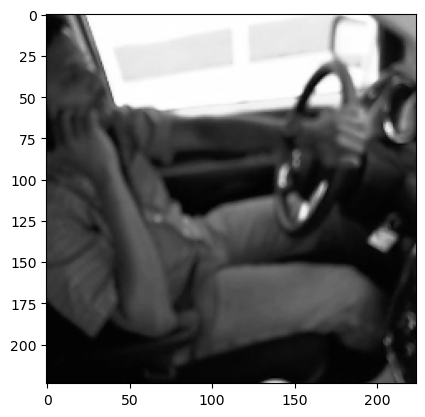

2


In [7]:
plt.imshow(X[5],cmap= 'gray')
plt.show()
print(Y[5])

In [8]:
## Converting images to nparray. 
# Encoding the Y
X = np.array(X).reshape(-1,224,224,1)
Y = to_categorical(Y)
print (X.shape)
print(Y[5])

(22424, 224, 224, 1)
[0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]


In [9]:
## constructing the Layers
X_train, X_test, y_train, y_test = train_test_split(X, Y, random_state=42, test_size=0.2)

In [10]:
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),activation='relu',input_shape=(224,224,1),padding = 'same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64,kernel_size = (3,3),activation = 'relu',padding = 'same'))
model.add(BatchNormalization())
model.add(Conv2D(64,kernel_size = (3,3),activation = 'relu',padding = 'same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(128,kernel_size = (3,3),activation = 'relu',padding = 'same'))
model.add(BatchNormalization())
model.add(Flatten())
model.add(Dense(128, activation = 'relu'))
model.add(Dense(10, activation='softmax'))
sgd = optimizers.SGD(lr = 0.001)
model.compile(loss='categorical_crossentropy',optimizer=sgd,metrics=['accuracy'])

2022-12-11 15:30:19.983705: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-12-11 15:30:19.984430: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [11]:
## Fitting the model
model.fit(X_train, y_train, epochs=3, validation_data=(X_test, y_test))

Epoch 1/3


2022-12-11 15:31:09.423222: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-12-11 15:31:10.484582: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


561/561 [==============================] - ETA: 0s - loss: 0.2714 - accuracy: 0.9247

2022-12-11 15:34:12.161529: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


561/561 [==============================] - 211s 369ms/step - loss: 0.2714 - accuracy: 0.9247 - val_loss: 0.2648 - val_accuracy: 0.9394
Epoch 2/3
561/561 [==============================] - 205s 365ms/step - loss: 0.0080 - accuracy: 0.9997 - val_loss: 0.0181 - val_accuracy: 0.9969
Epoch 3/3
561/561 [==============================] - 204s 364ms/step - loss: 0.0035 - accuracy: 1.0000 - val_loss: 0.0156 - val_accuracy: 0.9969


In [15]:
files = os.listdir('../imgs/test/')
files

['img_60161.jpg',
 'img_94786.jpg',
 'img_85853.jpg',
 'img_36327.jpg',
 'img_39014.jpg',
 'img_84595.jpg',
 'img_57915.jpg',
 'img_37039.jpg',
 'img_11940.jpg',
 'img_20545.jpg',
 'img_66510.jpg',
 'img_10486.jpg',
 'img_79430.jpg',
 'img_48835.jpg',
 'img_30756.jpg',
 'img_21883.jpg',
 'img_96191.jpg',
 'img_24723.jpg',
 'img_62776.jpg',
 'img_65019.jpg',
 'img_43960.jpg',
 'img_86382.jpg',
 'img_72565.jpg',
 'img_22352.jpg',
 'img_74114.jpg',
 'img_5811.jpg',
 'img_14838.jpg',
 'img_32141.jpg',
 'img_12291.jpg',
 'img_63468.jpg',
 'img_329.jpg',
 'img_32627.jpg',
 'img_80095.jpg',
 'img_22434.jpg',
 'img_15298.jpg',
 'img_35148.jpg',
 'img_90286.jpg',
 'img_55864.jpg',
 'img_13831.jpg',
 'img_2818.jpg',
 'img_98802.jpg',
 'img_72203.jpg',
 'img_91198.jpg',
 'img_34256.jpg',
 'img_87922.jpg',
 'img_24045.jpg',
 'img_61519.jpg',
 'img_79356.jpg',
 'img_93957.jpg',
 'img_7960.jpg',
 'img_16949.jpg',
 'img_59086.jpg',
 'img_76065.jpg',
 'img_30030.jpg',
 'img_69145.jpg',
 'img_9795.jpg'

Image number: 0
Image number: 1
Image number: 2
Image number: 3
Image number: 4
Image number: 5
Image number: 6
Image number: 7
Image number: 8
Image number: 9


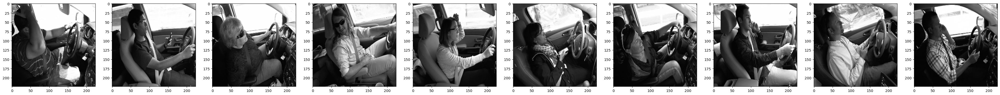

In [16]:
# labels is the image array
test_image = []
i = 0
figure, axes = plt.subplots(1, 10, figsize = (50,50 ))
files = os.listdir('../imgs/test')
nums = np.random.randint(low=1, high=len(files), size=10)
for i in range(10):
    print ('Image number:',i)
    img = cv2.imread('../imgs/test/'+files[nums[i]])
    img = color.rgb2gray(img)
    img = cv2.resize(img,(224,224))
    test_image.append(img)
    axes[i].imshow(img,cmap = 'gray')
    plt.show


In [17]:
test = []
for img in test_image:
    test.append(img)
test = np.array(test).reshape(-1,224,224,1)
prediction = model.predict(test)

2022-12-11 15:44:53.537740: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 425ms/step


In [18]:
prediction[0]

array([8.7722617e-01, 2.8035711e-03, 1.8273849e-02, 6.4885966e-04,
       3.0594366e-03, 1.5849877e-02, 1.7279228e-04, 2.6523453e-04,
       2.9049044e-02, 5.2651174e-02], dtype=float32)

In [20]:
tags = { "C0": "safe driving",
"C1": "texting - right",
"C2": "talking on the phone - right",
"C3": "texting - left",
"C4": "talking on the phone - left",
"C5": "operating the radio",
"C6": "drinking",
"C7": "reaching behind",
"C8": "hair and makeup",
"C9": "talking to passenger" }

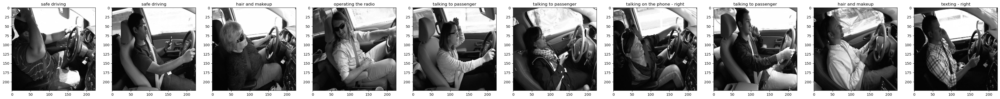

: 

In [34]:
# labels is the image array
i = 0
figure, axes = plt.subplots(1, 10, figsize = (50,50 ))
for i in range(10):
    axes[i].imshow(test[i].squeeze(),cmap = 'gray')
    predicted_class = 'C'+str(np.where(prediction[i] == np.amax(prediction[i]))[0][0])
    axes[i].set_title(tags[predicted_class])
    plt.show

